# import libraties

In [1]:
#### 在这一版中，数据使用了train,也使用了test 数据,使用小数据 data split 成15份, 采用完全 Gradient Shapley, 生产异常数据15份
## 数据值
import numpy as np
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.preprocessing import Normalizer, OneHotEncoder, StandardScaler,MinMaxScaler
import matplotlib.pyplot as plt
import lime
import lime.lime_tabular
from __future__ import print_function
import math
from sklearn.metrics import f1_score
from sklearn.neural_network import MLPClassifier
from sklearn.utils import shuffle

## Data Ingestion & Preparation

### data ingestion 

In [2]:

datasets_1 = np.genfromtxt('./Data/adult.data', delimiter=', ', dtype=str)
datasets_2 = np.genfromtxt('./Data/adult.test', delimiter=', ', dtype=str,autostrip = True )
for i, n in enumerate(datasets_2[:,14]):
    datasets_2[i,14] = n.strip('.')
feature_and_labels_names=["Age", "Workclass", "fnlwgt", "Education", "Education-Num", "Marital Status","Occupation", 
                 "Relationship", "Race", "Sex", "Capital Gain", "Capital Loss","Hours per week","Country","income"]

alldata =np.concatenate((datasets_1, datasets_2), axis=0)

df = pd.DataFrame(alldata,columns=feature_and_labels_names)                         
# df = shuffle(df)                  


### data preparation 

In [3]:
### data clean
# summarize the number of unique values in each column
from numpy import unique
for i in range(alldata.shape[1]):
    if len(unique(alldata[:, i])) <=1:
           print(i)
    else:
           print(i, len(unique(alldata[:, i])))



0 74
1 9
2 28523
3 16
4 16
5 7
6 15
7 6
8 5
9 2
10 123
11 99
12 96
13 42
14 2


In [4]:
# unknown values are removed
print(df.shape)
for a in feature_and_labels_names:
    df = df[df[a].str.contains('\?') == False]

print(df.shape)
# Identify Rows That Contain Duplicate Data & removing duplicate rows
df.drop_duplicates()
df.dropna()
df.isnull().sum()
print(df.shape)



(48842, 15)
(45222, 15)
(45222, 15)


0         77516
1         83311
2        215646
3        234721
4        338409
          ...  
48836    245211
48837    215419
48839    374983
48840     83891
48841    182148
Name: fnlwgt, Length: 45222, dtype: int32


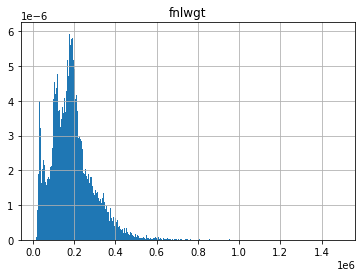

In [5]:
#visuallize date distribution, delete outliers
df['fnlwgt']=df['fnlwgt'].astype(str).astype(int)
print(df['fnlwgt'])
ax=df.hist(column=['fnlwgt'],density=True,bins=500)


(44995, 15)


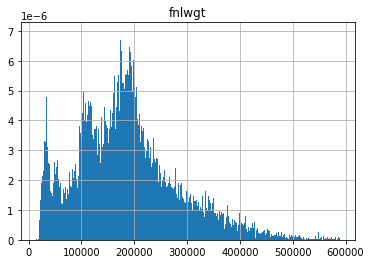

In [6]:
# remove outliers 
q_hi = df["fnlwgt"].quantile(0.995)
df = df[(df["fnlwgt"] < q_hi)]
ax=df.hist(column=['fnlwgt'],density=True,bins=500)
print(df.shape)

In [7]:
### feature selections and delete
df=df.drop('Education-Num',axis = 1) # Education-num is the same feature as Education

In [8]:
np.random.seed(5)
data = df.to_numpy()
np.random.shuffle(data)
# print(data[0:5,:])

y = data[:,-1]
data =np.delete(data,[13],axis = 1)

In [9]:
# data transform
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelEncoder

categorical_features=[0,1,3,4,5,6,7,8,12]
categorical_names = {}
for feature in categorical_features:
    le = LabelEncoder()
    le.fit(data[:, feature])
    data[:, feature] = le.transform(data[:, feature])
    categorical_names[feature] = le.classes_


t = [('cat', OneHotEncoder(),[0,1,3,4,5,6,7,8,12]),('num',MinMaxScaler(),
            [2,9,10,11])]

transformer = ColumnTransformer(transformers=t)
le= LabelEncoder()
y = le.fit_transform(y)
class_names = le.classes_
data = data.astype(float)

data_1 = data[0:3000]
y_1 = y[0:3000]

In [10]:
# data split

train, test, labels_train, labels_test = train_test_split(data_1,y_1,train_size=0.80,
                                                          random_state=1)
transformer.fit(data)
Encoded_train = transformer.transform(train)

# print(train.shape)

## model build & evaluation

In [11]:
# hyperparameters tune
# from sklearn.metrics import f1_score
# from sklearn.neural_network import MLPClassifier
# mlp_qs=MLPClassifier(max_iter=2000)
# parameter_space ={
#     'hidden_layer_sizes': [(5,),(10,),(15,),(20,),(40,)],
#     'activation':['tanh','relu'],
#     'solver':['sgd'],
#     'alpha':[0.001,0.005,0.01],
    
# }
# #  'learning_rate':['constant,'adaptive'],
# from sklearn.model_selection import GridSearchCV
# clf = GridSearchCV(mlp_qs,parameter_space,n_jobs=-1,cv = 2)
# clf.fit(Encoded_train,labels_train)


# hidden_layer_sizes=(10,), random_state=3,max_iter=500,
#                    activation='relu',alpha =0.001,solver='sgd'

In [12]:
# print('Best parameters found:\n', clf.best_params_)
# hidden_layer_sizes=(10,), random_state=3,max_iter=500,
#                    activation='relu',alpha =0.001,solver='sgd'

In [13]:
clf = MLPClassifier(hidden_layer_sizes=(15,), random_state=3,max_iter=1000,
                   activation='relu',alpha =0.001,solver='sgd')


clf.fit(Encoded_train, labels_train)
# clf.fit(Encoded_train, y)

y_true = clf.predict(transformer.transform(test))

predict_fn = lambda x: clf.predict_proba(transformer.transform(x)).astype(float)
print(f1_score(y_true, labels_test, average='micro'))
f1_score(y_true, labels_test, average='macro')


0.8083333333333333


0.7314746710564721

## building explainer & evaluation 

### building explainer 

In [14]:
import lime
import lime.lime_tabular
feature_names=["Age", "Workclass", "fnlwgt", "Education", "Marital Status","Occupation", 
                 "Relationship", "Race", "Sex", "Capital Gain", "Capital Loss","Hours per week","Country"]

explainer = lime.lime_tabular.LimeTabularExplainer(data,feature_names = feature_names,class_names=class_names,
                                                   categorical_features=categorical_features, 
         
                                                   categorical_names=categorical_names)

### generate explaination example

In [15]:
a=np.arange(10)
for i in a:
    b = explainer.explain_instance(data_1[i],predict_fn, num_features=5, top_labels=1)
    b.show_in_notebook(predict_proba=True,show_predicted_value=True)
    y_true = clf.predict(transformer.transform([data_1[i]]))
    print(y_true, labels_test[i])



[1] 0


[0] 0


[0] 0


[0] 0


[1] 1


[0] 1


[0] 0


[0] 0


[0] 0


[1] 0


## feature importance caculation and feature selection with XAI

In [14]:
import numpy as np
A=np.arange(len(data_1))
fir ={'0':[0,0,0],'1':[0,0,0],
                              '2':[0,0,0],'3':[0,0,0],'4':[0,0,0],'5':[0,0,0],
                              '6':[0,0,0],'7':[0,0,0],'8':[0,0,0],'9':[0,0,0],
                              '10':[0,0,0],'11':[0,0,0],'12':[0,0,0]}
# print(feature_importance_frequence['0'][1])
for i in A:
    b = explainer.explain_instance(data_1[i],predict_fn, num_features=5, top_labels=1)
    for v in b.local_exp:
        g=b.local_exp[v]
#         print(g)
        d = np.asarray(g) 
    for n,i in d:
        intn = n.astype(int).astype(str)
        fir[intn][0] += 1
        fir[intn][1] += abs(i)   # there is a problem


In [15]:
for j in range(0,13):
    fir[str(j)][2] = fir[str(j)][1] /(fir[str(j)][0]+1)

In [16]:
### feature importance 
import matplotlib.pyplot as plt
# x_label =["Age", "Workclass", "fnlwgt", "Education", "Education-Num", "Marital Status","Occupation", 
#                  "Relationship", "Race", "Sex", "Capital Gain", "Capital Loss","Hours per week","Country"]
x_label = np.arange(13)
y_frequency =[]
y_all =[]
y_average = []
for values in fir.values():
    y_frequency.append(values[0])
    y_all.append(round(values[1],2))
    y_average.append(round(values[2],2))
print(y_frequency,y_all,y_average)

[324, 337, 5, 1860, 2889, 1982, 2996, 792, 3000, 268, 540, 5, 2] [22.45, 17.38, 0.07, 185.26, 455.28, 183.0, 290.15, 21.82, 172.16, 7.72, 21.39, 0.06, 0.11] [0.07, 0.05, 0.01, 0.1, 0.16, 0.09, 0.1, 0.03, 0.06, 0.03, 0.04, 0.01, 0.04]


In [17]:
### scale
from sklearn import preprocessing
scaler = preprocessing.MinMaxScaler()
np.set_printoptions(precision=3)
y_frequency = np.array(y_frequency).reshape(13,1)
y_all = np.array(y_all).reshape(13,1)
y_average =np.array(y_average).reshape(13,1)


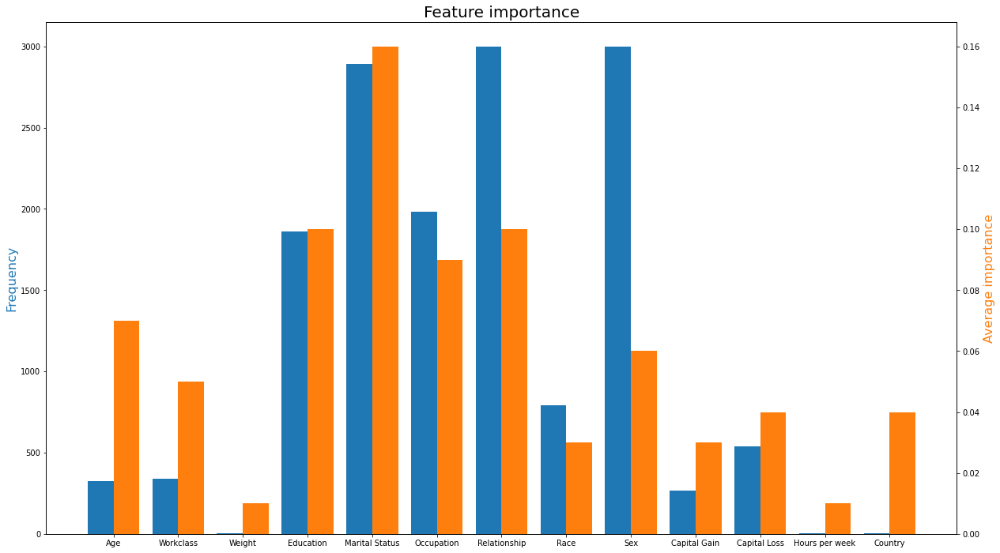

In [19]:
# print(y_frequency)
np.set_printoptions(precision=2)

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])

plt.rcParams["figure.figsize"] = (16,9)
labels = ["Age", "Workclass", "Weight", "Education",  "Marital Status","Occupation", 
                 "Relationship", "Race", "Sex", "Capital Gain", "Capital Loss","Hours per week","Country"]
x = np.arange(len(labels))
width =0.4
ax.bar(x-width/2, y_frequency.flatten(), width=0.4,linewidth=0.2,color = 'C0')
ax1 = ax.twinx()
ax1.bar(x+width/2, y_average.flatten().flatten(),width=0.4,linewidth=0.2,color = 'C1')

plt.xticks(x, labels)
ax.set_ylabel('Frequency', color='C0',fontsize = 16)
ax1.set_ylabel('Average importance', color='C1', fontsize = 16)
ax.set_title('Feature importance',fontsize=20)
plt.xlabel('X-axis Label', fontsize=20)
plt.show()

In [16]:
##  feature selection and delete with XAI
# refined_data = np.delete(data,[7],axis = 1)
data_2 = np.delete(data_1,[2,11],axis = 1)
data = np.delete(data,[2,11],axis = 1)

In [17]:
r_train, r_test, r_labels_train, r_labels_test = train_test_split(data_2,y_1,train_size=0.80,
                                                          random_state=1)
# x = [('cat', OneHotEncoder(),[0,1,2,3,4,5,6,7,11]),('num',MinMaxScaler(),
#             [8,9,10])]
# x = [('cat', OneHotEncoder(),[0,1,3,4,5,6,7,11]),('num',MinMaxScaler(),
#             [2,8,9,10])]
x = [('cat', OneHotEncoder(),[0,1,2,3,4,5,6,7,10]),('num',MinMaxScaler(),
            [8,9])]


r_transformer = ColumnTransformer(transformers=x)
r_transformer.fit(data)
Encoded_r_train = r_transformer.transform(r_train)


In [18]:
from sklearn.metrics import accuracy_score
clf1 = MLPClassifier(hidden_layer_sizes=(15,), random_state=3,max_iter=1000,
                   activation='relu',alpha =0.001,solver='sgd')
clf1.fit(Encoded_r_train, r_labels_train)
r_y_true = clf1.predict(r_transformer.transform(r_test))
print(f1_score(r_y_true, labels_test, average='micro'))
f1_score(r_y_true, labels_test, average='macro')


0.81


0.7304157273257555

# 6 data-based explanation 

In [19]:
x1 = data[0:15000]
x2 = data[15000:30000]
y1 = y[0:15000]

y2 = np.random.randint(0,2,size=15000)
print(y2.shape,y1.shape)
x =np.concatenate((x1,x2),axis=0)

y =np.concatenate((y1,y2),axis =0)

x = x.reshape(30,1000,11)
y = y.reshape(30,1000,)

datakeys = [str(i) for i in list(range(30))]
datavalue ={}
for i in range(len(datakeys)):
    datavalue[i]=[0,0]


(15000,) (15000,)


In [20]:
def accuracy(x,y,mode):
    classifier =MLPClassifier(hidden_layer_sizes=(15,), random_state=3,max_iter=1000,
                   activation='relu',alpha =0.001,solver='sgd')
    encodedtrain = r_transformer.transform(x)
    if mode == 1:
        classifier.partial_fit(encodedtrain,y, classes=list(range(2)))
    elif mode == 0:
        classifier.fit(encodedtrain,y)  
    r_y_true = classifier.predict(r_transformer.transform(r_test))
    accuracy = f1_score(r_y_true, labels_test, average='micro') # f1  micro accuracy = 
    macro = f1_score(r_y_true, labels_test, average='macro')
    a = [accuracy,macro]     
    return a

inicial_accuracy =accuracy(r_train,r_labels_train,0)
def data_value(x,y,test=r_train,label=r_labels_train):
    metric = [0,0]
    each_accuracy=[inicial_accuracy]
    data_i = test
    y_1 = r_labels_train
    for i in np.random.permutation(len(x)):
        data_i =  np.concatenate((data_i,x[i]), axis=0)
        y_1 = np.concatenate((y_1,y[i]), axis=0)
        each_accuracy.append(accuracy(data_i,y_1,1))
        metric = np.array(each_accuracy[-1])-np.array(each_accuracy[-2])
        datavalue[i][0] += metric[0]
        datavalue[i][1] += metric[1]
    pass



In [21]:
# reach convergence 
n= 300
each_turn_data=[]
for j in range(n):
    data_value(x,y)
    each_turn_data.append(data_value(x,y))


In [22]:
# caculate the average value
group_value =[]
for i in range(len(x)):
    group_value.append(np.array(datavalue[i]).astype(float)/n)

In [37]:
# separate high value from adverse value
valuable_data=[]
lowvalue_data=[]
adverse_value=[]
aver_value = np.array(group_value)
for i in range(30):
    if aver_value[i,0] >= 0.000:
            
        valuable_data.append(i)
        print(aver_value[i][0]) #high data importance value
    elif aver_value[i,0] <= -0.01:
        adverse_value.append(i)
        print(aver_value[i][0]) #adverse data importance value
    else:
        lowvalue_data.append(aver_value[i][0])
        



0.008277777777777754
0.008977777777777756
0.0027333333333333138
0.016994444444444444
0.012411111111111081
0.009355555555555546
0.01674444444444442
0.005111111111111085
0.014872222222222202
0.0065499999999999925
0.01120555555555553
0.01707222222222223
0.005449999999999972
0.01362777777777774
-0.027677777777777787
-0.025761111111111117
-0.019850000000000007
-0.02170555555555557
-0.020766666666666676
-0.02292222222222223
-0.024088888888888906
-0.016883333333333368
-0.01860000000000001
-0.012672222222222232
-0.023405555555555572
-0.012694444444444437
-0.01789444444444445
-0.021355555555555596
-0.027094444444444477


In [44]:
print(valuable_data)
print(lowvalue_data)

[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
[-0.0028388888888889125]


In [39]:
# tranining with valuable datasets
valuable_macro =[accuracy(r_train,r_labels_train,0)[1]]
valuable_accuracy = [accuracy(r_train,r_labels_train,0)[0]]
data_i = r_train
y_1 = r_labels_train

for i in np.random.permutation(valuable_data):
    data_i = np.concatenate((data_i,x[i]), axis=0)
    y_1 = np.concatenate((y_1,y[i]), axis=0)
    macro=accuracy(data_i,y_1,0)[1]
    accu = accuracy(data_i,y_1,0)[0]

    valuable_macro.append(macro)
    valuable_accuracy.append(accu)

In [50]:
print(valuable_macro)
print(valuable_accuracy)

[0.7304157273257555, 0.7404162610670746, 0.756039947490503, 0.7612890391883826, 0.7641500433154855, 0.7595704325060775, 0.7670807453416149, 0.7624223602484472, 0.7624223602484472, 0.7682288045241736, 0.7711079684483508, 0.7612322289673684, 0.7699805219196172, 0.773971338950735, 0.7860224331320103]
[0.81, 0.8133333333333334, 0.825, 0.8266666666666667, 0.8283333333333334, 0.825, 0.8333333333333334, 0.83, 0.83, 0.8333333333333334, 0.835, 0.83, 0.835, 0.8366666666666667, 0.845]


In [40]:
# training with adverse value 
data_i = r_train
y_1 = r_labels_train
adverse_macro =[accuracy(r_train,r_labels_train,0)[1]]
adverse_accuracy = [accuracy(r_train,r_labels_train,0)[0]]
for i in np.random.permutation(adverse_value):
    data_i = np.concatenate((data_i,x[i]), axis=0)
    y_1 = np.concatenate((y_1,y[i]), axis=0)
    macro=accuracy(data_i,y_1,0)[1]
    accu = accuracy(data_i,y_1,0)[0]
    
    adverse_macro.append(macro)
    adverse_accuracy.append(accu)
print(adverse_macro)
print(adverse_accuracy)


[0.7304157273257555, 0.712794648173444, 0.6777291297058872, 0.6190476190476191, 0.6246594692765614, 0.6027542372881356, 0.6022913256955811, 0.5585142742697417, 0.5409766000641094, 0.5335420640551254, 0.5476416373000813, 0.5666703389519298, 0.5688668906631983, 0.5677933177933179, 0.5555259609462136, 0.5648815248064827]
[0.81, 0.795, 0.78, 0.745, 0.7416666666666667, 0.7333333333333333, 0.7299999999999999, 0.7183333333333334, 0.7016666666666667, 0.695, 0.7033333333333334, 0.705, 0.7016666666666667, 0.7033333333333334, 0.7033333333333334, 0.6933333333333334]


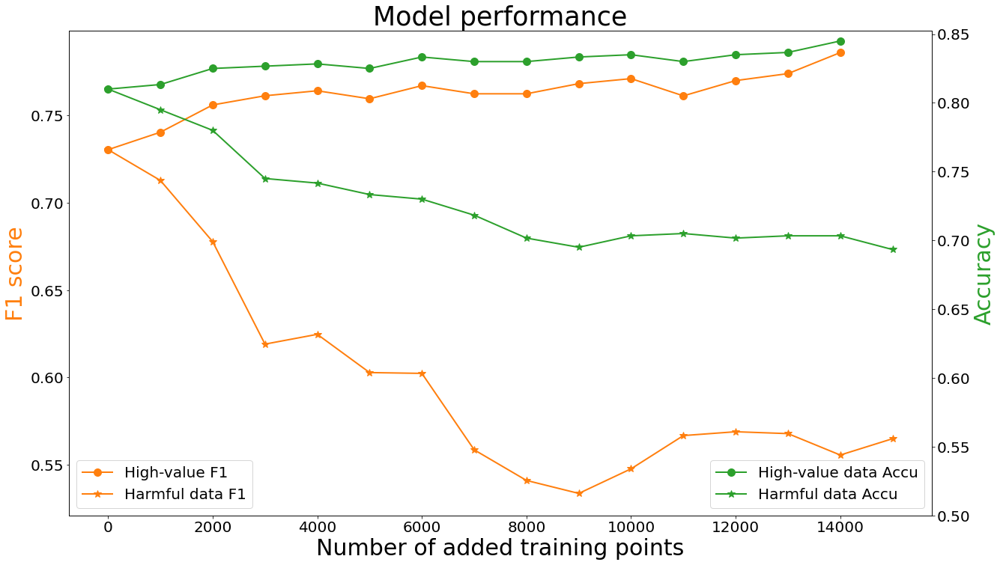

In [76]:
np.set_printoptions(precision=2)

fig1 = plt.figure()
ax = fig1.add_axes([0,0,1,1])
xdata =np.linspace(0,14000,15)
xdata2 =np.linspace(0,15000,16)
y1 = valuable_macro
y2 = adverse_macro
y3 = valuable_accuracy
y4 = adverse_accuracy

plt.rcParams["figure.figsize"] = (16,9)
ysticks =np.arange(0.5,0.9,0.05)
plt.yticks(ysticks)
plt.xticks(size =20)
plt.yticks(size =20)
ax1 = ax.twinx()


ax.plot(xdata,y1,linewidth=2.0,label="High-value F1",color='C1',marker='o',ms=10)
ax.plot(xdata2,y2,linewidth=2.0,label ="Harmful data F1",color = 'C1',marker='*',ms=10)
ax.set_ylabel('F1 score',fontsize = 30, color = 'C1')
ax.set_xlabel('Number of added training points',fontsize = 30)
ax.legend(fontsize = 20,loc = 3)
ax.set_title('Model performance',fontsize=35)
ax1.set_xlabel('Number of added training points',fontsize = 30)
ax1.plot(xdata,y3,linewidth=2.0,label="High-value data Accu",color='C2',marker='o',ms=10)
ax1.plot(xdata2,y4,linewidth=2.0,label ="Harmful data Accu",color = 'C2',marker='*',ms=10)
ax1.set_ylabel('Accuracy', fontsize = 30, color = 'C2')
ax1.legend(fontsize = 20,loc = 4)
ysticks =np.arange(0.5,0.9,0.05)
plt.yticks(ysticks,size = 20)

# ax1 = ax.twinx()
# ax1.plot(xdata,y3,linewidth=2.0,label="High value data",color='C1',marker='o',ms=10)
# ax1.plot(xdata2,y4,linewidth=2.0,label ="Harmful data",color = 'C2',marker='*',ms=10)
# ax1.set_ylabel('Accuracy', fontsize = 30)
plt.show()

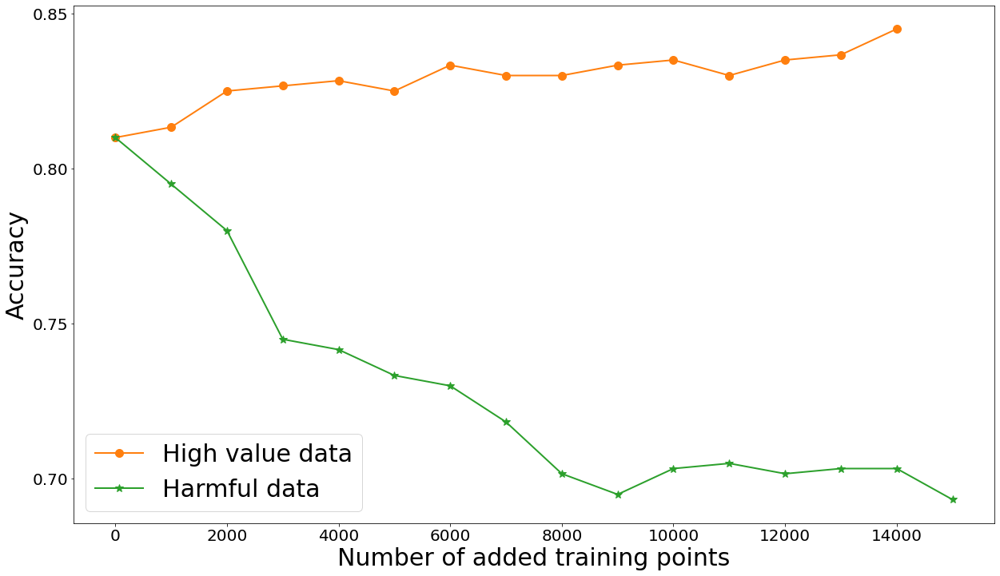

In [58]:
#accuracy
fig2 = plt.figure()
# plt.ylim((0.50,0.80))
ax1 = fig2.add_axes([0,0,1,1])
xdata =np.linspace(0,14000,15)
xdata2 =np.linspace(0,15000,16)
y3 = valuable_accuracy
y4 = adverse_accuracy
ysticks =np.arange(0.5,0.9,0.05)
plt.yticks(ysticks)
plt.xticks(size =20)
plt.yticks(size =20)
ax1.set_xlabel('Number of added training points',fontsize = 30)
ax1.plot(xdata,y3,linewidth=2.0,label="High value data",color='C1',marker='o',ms=10)
ax1.plot(xdata2,y4,linewidth=2.0,label ="Harmful data",color = 'C2',marker='*',ms=10)
ax1.set_ylabel('Accuracy', fontsize = 30)

ax1.legend(fontsize = 30)
plt.show()

In [23]:
for i in range(16):
    print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15


In [45]:
xdata =np.linspace(0,14000,15)
print(xdata)

[    0.  1000.  2000.  3000.  4000.  5000.  6000.  7000.  8000.  9000.
 10000. 11000. 12000. 13000. 14000.]
